# Denoising Diffusion Probabilistic Model [DDPM]

It is a class of **Latent Variable Models'**, a generative model, that work by iteratively adding noise to an input signal (image) and then learning to denoise from the noisy signal to generate new samples.

It comprises of two process, **Forward process** and **Reverse process**.

*Forward process* or *Diffusion process*, a Markov chain that gradually adds Gaussian noise to the data according to a variance schedule.

*Reverse process*, is defined as a Markov chain with learned Gaussian Transitions.

![Diffusion](Others/diffusion.png)

### 1. Dataset Creation and Visualization

In [1]:
"""Import Packages"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchview import draw_graph # Ref and credits: https://github.com/mert-kurttutan/torchview for visualizing model graph.
from torchvision.utils import make_grid
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
from torchsummary import summary
from PIL import Image
from DDPM_Scheduler import DDPM_Scheduler
from Unet_module import UNET
import yaml
import cv2
%matplotlib inline

In [2]:
"""Extraction of Parameters from YAML file."""

with open('config.yaml', 'r') as file:
    try:
        config = yaml.safe_load(file)
    except yaml.YAMLError as exc:
        print(exc)
    print(config)

{'version': 'v1.0', 'image_size': {'channels': 3, 'height': 32, 'width': 32}, 'sample_dir': 'Generated', 'seed': 34, 'diffusion_process': {'num_training_steps': 1000, 'num_inference_steps': 1000, 'beta_1': 0.0001, 'beta_T': 0.02}, 'reverse_process': {'time_emb_dim': 128, 'lr': 0.001}}


In [3]:
Diffusion_config = config["diffusion_process"]
Model_config = config["reverse_process"]
Image_dim = config["image_size"]
seed = config["seed"]
sample_dir = config["sample_dir"]

batch_size = 64
image_size = (Image_dim["channels"], Image_dim["height"], Image_dim["width"])
num_training_steps = Diffusion_config["num_training_steps"]
num_inference_steps = Diffusion_config["num_inference_steps"]
time_emb_dim = Model_config["time_emb_dim"]
lr = Model_config["lr"]

In [4]:
"""Images Directory"""
# Dataset Ref: https://www.kaggle.com/datasets/mostafamozafari/bitmoji-faces

Root_Directory = 'D:\Envs\DCGAN\Bitmoji_Faces\BitmojiDataset'
for l in os.listdir(Root_Directory):
    if os.path.isdir(os.path.join(Root_Directory, ''.join(l))):
        Directory = os.path.join(Root_Directory, ''.join(l))
Bitmoji_Images = os.listdir(Directory)
len(Bitmoji_Images)

4084

In [5]:
"""Class CSV with Image_ID and Gender Class."""

csv_directory = os.path.join(Root_Directory, 'attributes.csv')
Class = pd.read_csv(csv_directory)

In [6]:
"""Rename Target Column."""

print(Class.head())
Class = Class.rename(columns = {'is_male': 'Gender'})
Class.head()

   image_id  is_male
0  0000.jpg        1
1  0001.jpg       -1
2  0002.jpg        1
3  0003.jpg       -1
4  0004.jpg       -1


,image_id,Gender
0,0000.jpg,1
1,0001.jpg,-1
2,0002.jpg,1
3,0003.jpg,-1
4,0004.jpg,-1


In [7]:
"""Replace -1 to 0 for Female Category."""

Class['Gender'] = Class['Gender'].apply(lambda x: 0 if x == -1 else x) # 1 - Male, 0 - Female
Class.head()

,image_id,Gender
0,0000.jpg,1
1,0001.jpg,0
2,0002.jpg,1
3,0003.jpg,0
4,0004.jpg,0


In [8]:
"""Creating Custom Dataset with Images and Labels from CSV file."""

class Image_Label_Dataset(Dataset):
    def __init__(self, Image_folder, Class_csv, transforms):
        self.df = Class_csv
        self.images_folder = Image_folder
        self.transform = transforms

    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        filename = self.df['image_id'][idx]
        label = self.df['Gender'][idx]
        image = Image.open(os.path.join(self.images_folder, filename))
        image = self.transform(image)
        image = (image * 2) - 1
        return image, label

In [9]:
"""Transformations for Image."""

transform = T.Compose([
                      T.Resize((image_size[1], image_size[2])), 
                      T.ToTensor()
                      ])

In [10]:
Dataset = Image_Label_Dataset(Directory, Class, transform)

In [4]:
"""Functions to show and save images in batch."""

def show_and_save_images(images, nmax = 64, t: int = None, index = None, save = False, show = True):
    
    images = torch.clamp(images, -1, 1).detach().cpu()
    images = (images + 1) / 2
    images = (images * 255).type(torch.uint8)
    fig, ax = plt.subplots(figsize = (8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(images[:nmax], nrow = 8).permute(1, 2, 0))
    if t is not None:
        ax.set_title('Noise at Timestep: {}'.format(t))
    
    if show:  
        plt.show()
    if save:
        img_name = f'generated-image-step-{index:0=4d}-{t:0=3d}.png'
        fig.savefig(os.path.join(sample_dir, img_name), bbox_inches='tight')
        plt.close()
        

def show_batch(dl, nmax = 64):
    for images, _ in dl:
        show_and_save_images(images, nmax)
        break

In [12]:
"""Creating DataLoader from above dataset."""

Train_Dl = DataLoader(Dataset, batch_size, shuffle = True, num_workers = 0)

In [5]:
Label = {"female" : 0, "male" : 1}
Label_size = len(Label)
print(Label_size)

2


In [14]:
img, _ = next(iter(Train_Dl))

In [15]:
img.size()

torch.Size([64, 3, 32, 32])

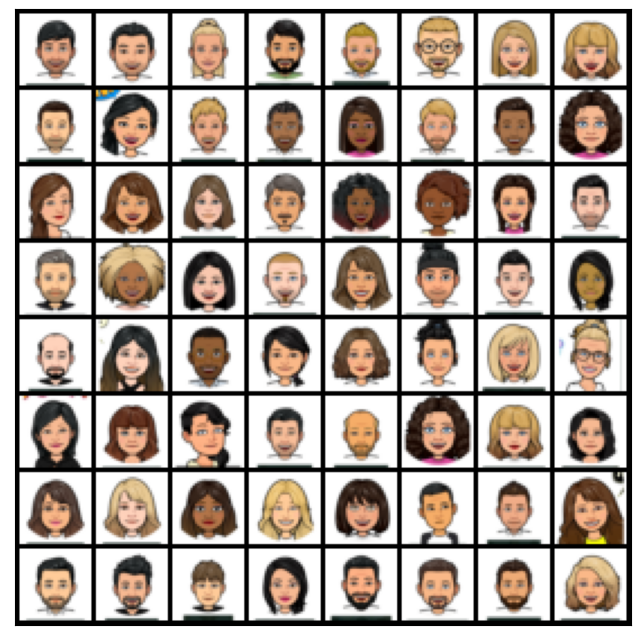

In [16]:
show_batch(Train_Dl)

### 2. Diffusion Scheduler

In [6]:
"""Initialising Scheduler."""

ddpm = DDPM_Scheduler(Diffusion_config["beta_1"], Diffusion_config["beta_T"], num_training_steps)

In [18]:
"""Adding Noise to the images for the given timesteps."""

t = torch.Tensor([0, 50, 100, 150, 200, 300, 600, 700, 800, 900, 999]).long()
Images = []
for step in t:
    Img_t = []
    for image in img:
        noise = torch.rand_like((image))
        noised_image = ddpm.diffusion_process(image.unsqueeze(0), step, noise.unsqueeze(0))
        Img_t.append(noised_image)
    Images.append(torch.cat(Img_t))

In [19]:
Images[0].size()

torch.Size([64, 3, 32, 32])

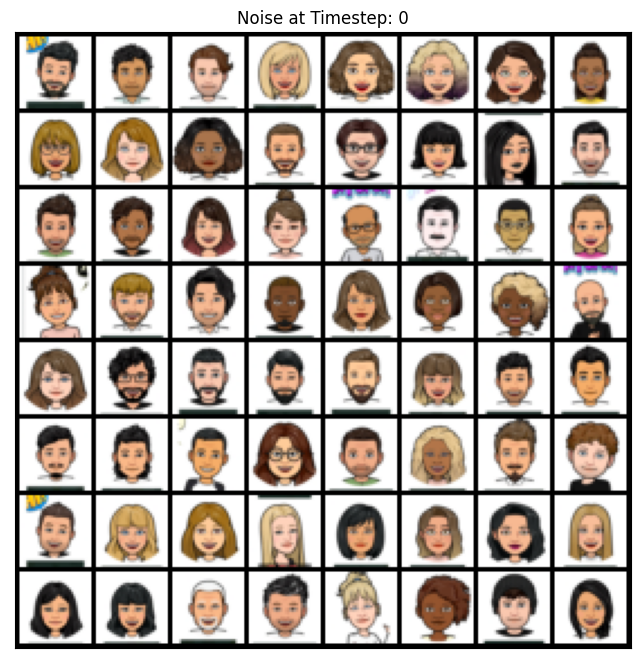

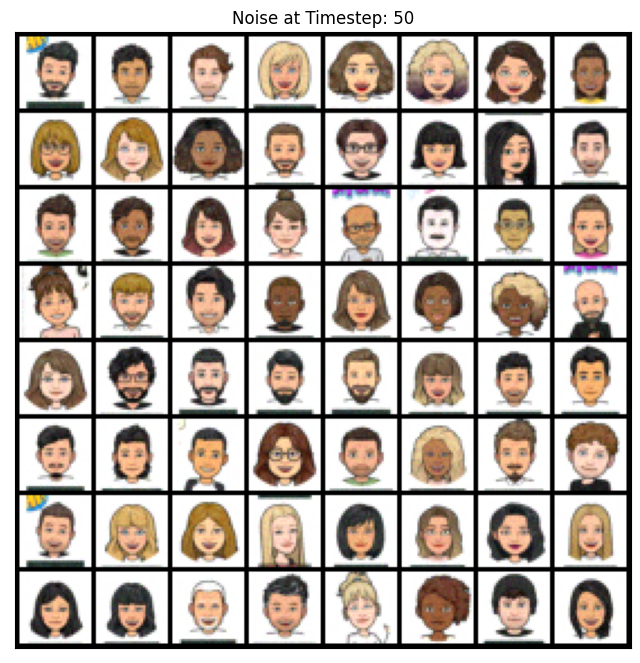

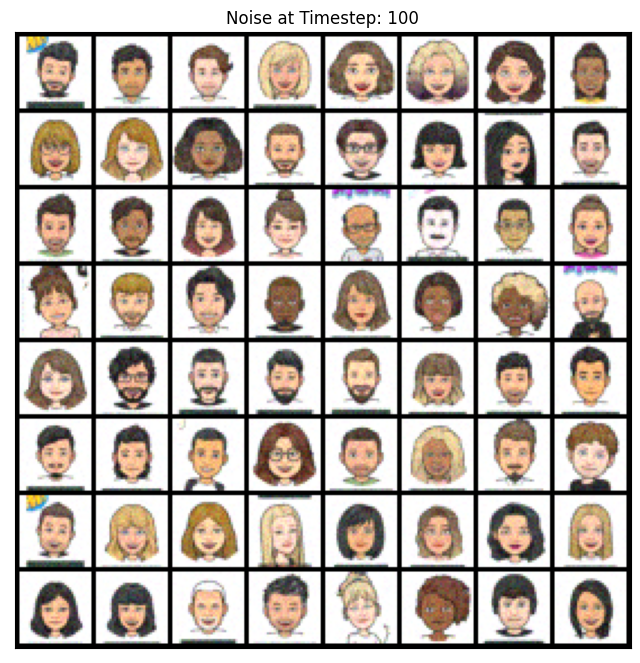

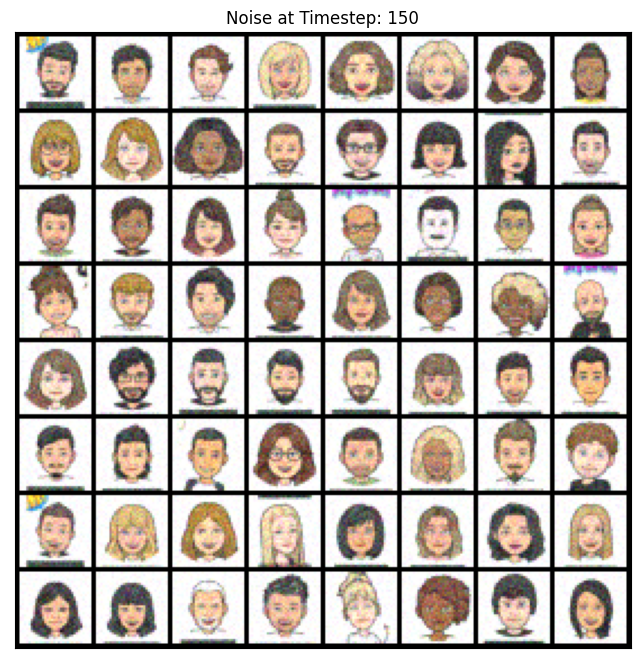

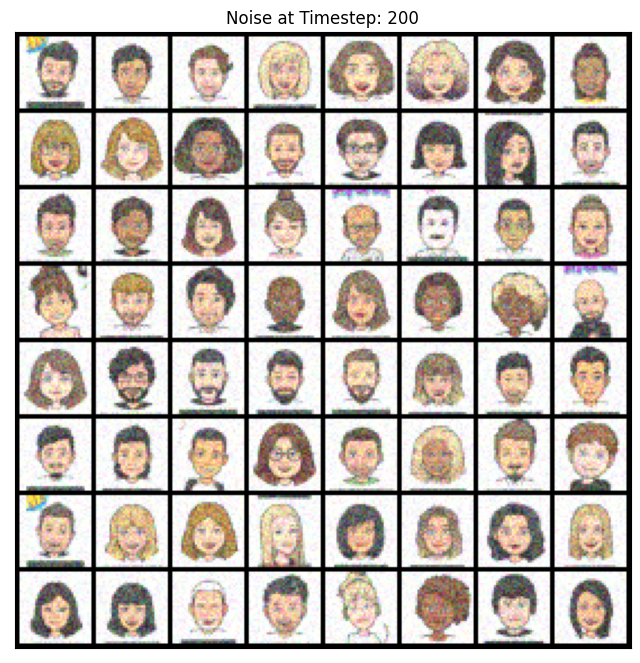

...

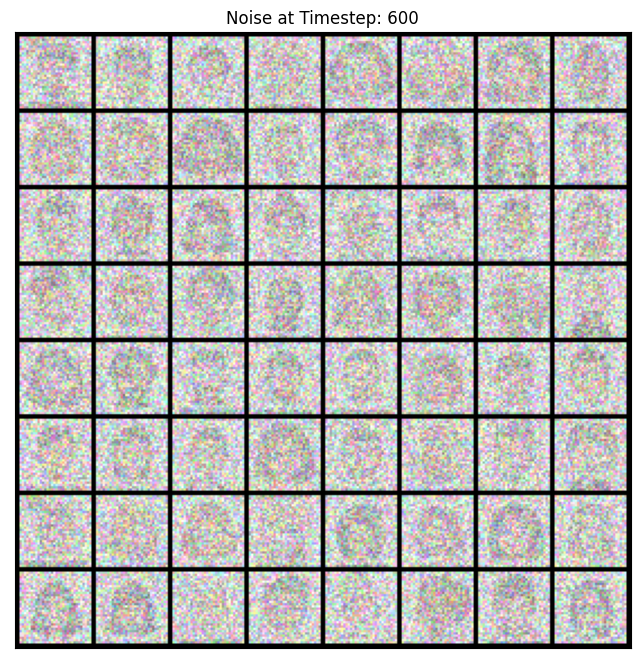

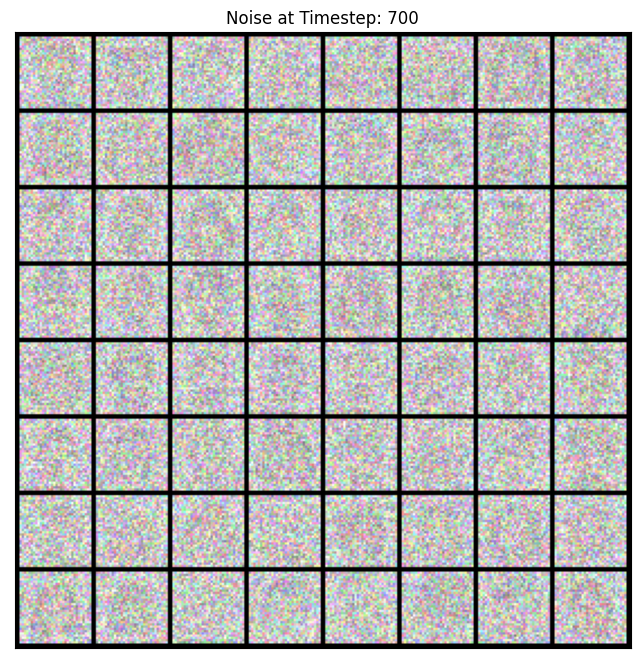

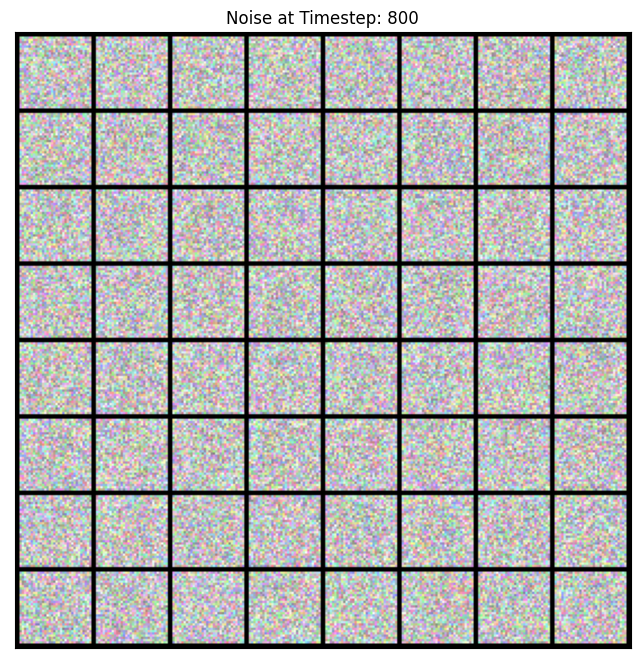

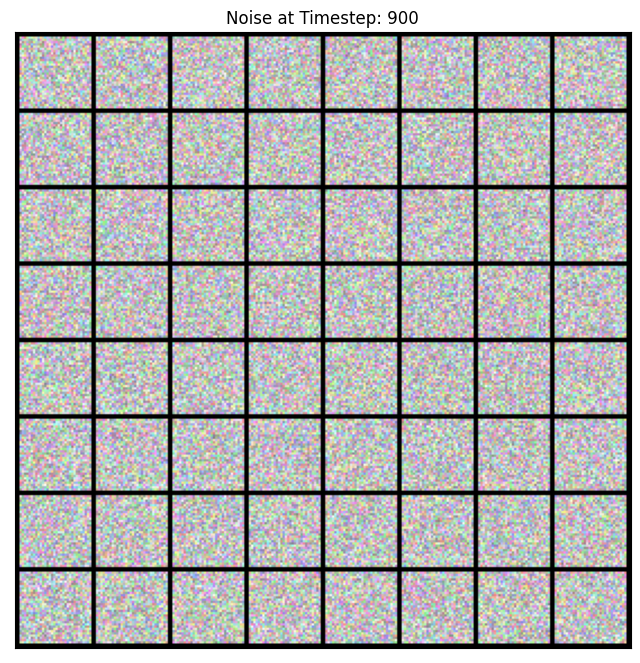

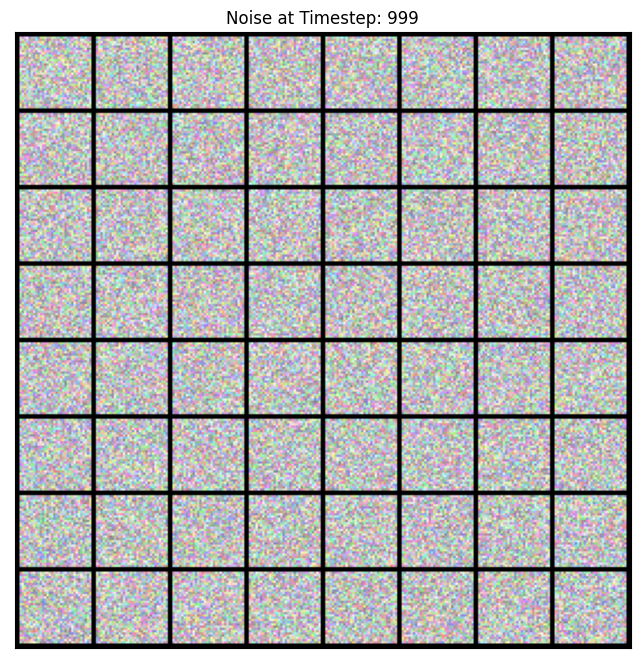

In [20]:
"""Visualization of Images with Noise at each timestep."""

for i, step in enumerate(t):
    show_and_save_images(Images[i], nmax = 64, t = int(step), index = i, save = True)
    print() 

In [7]:
def get_default_device():
    """Use GPU if available, else CPU"""
    if torch.cuda.is_available():
        for i in range(torch.cuda.device_count()):
            print(torch.cuda.get_device_properties(i))
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move Tensors to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a Dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [8]:
"""Check for the device."""
device = get_default_device()

_CudaDeviceProperties(name='NVIDIA GeForce RTX 3060 Laptop GPU', major=8, minor=6, total_memory=6143MB, multi_processor_count=30)


In [9]:
generator = torch.Generator(device = device)
generator.manual_seed(seed)

In [24]:
"""Changing the DataLoader to the Device."""
Train_Dl = DeviceDataLoader(Train_Dl, device)

### 3. UNET

In [10]:
"""Initialising of UNET Class."""

unet = UNET(image_size[0], time_emb_dim, Label_size)

In [26]:
Num_of_parameters = sum(p.numel() for p in unet.parameters())
print("Model Parameters : {:.3f} M".format(Num_of_parameters / 1e6))

Model Parameters : 1.589 M


In [27]:
img_dummy = torch.randn(3, 3, 32, 32)
labels_dummy = torch.randint(0, 2, size = (3,), dtype = torch.long)
t = torch.randint(0, num_training_steps, (3,)).type(torch.long)

In [28]:
"""Summary report of Initialised UNET model."""
summary(unet, [(img_dummy), (labels_dummy), (t)], device = 'cpu')

Layer (type:depth-idx)                        Output Shape              Param #
├─Time_Encoding: 1-1                          [-1, 128]                 --
├─Embedding: 1-2                              [-1, 128]                 256
├─Sequential: 1-3                             [-1, 128]                 --
|    └─Linear: 2-1                            [-1, 256]                 33,024
|    └─SiLU: 2-2                              [-1, 256]                 --
|    └─Linear: 2-3                            [-1, 128]                 32,896
├─Conv2d: 1-4                                 [-1, 16, 32, 32]          448
├─ModuleList: 1                               []                        --
|    └─Resnet_Block: 2-4                      [-1, 32, 32, 32]          --
|    |    └─Sequential: 3-1                   [-1, 32]                  4,128
|    |    └─Conv_block: 3-2                   [-1, 32, 32, 32]          4,704
|    |    └─Conv_block: 3-3                   [-1, 32, 32, 32]          9,312
|

Layer (type:depth-idx)                        Output Shape              Param #
├─Time_Encoding: 1-1                          [-1, 128]                 --
├─Embedding: 1-2                              [-1, 128]                 256
├─Sequential: 1-3                             [-1, 128]                 --
|    └─Linear: 2-1                            [-1, 256]                 33,024
|    └─SiLU: 2-2                              [-1, 256]                 --
|    └─Linear: 2-3                            [-1, 128]                 32,896
├─Conv2d: 1-4                                 [-1, 16, 32, 32]          448
├─ModuleList: 1                               []                        --
|    └─Resnet_Block: 2-4                      [-1, 32, 32, 32]          --
|    |    └─Sequential: 3-1                   [-1, 32]                  4,128
|    |    └─Conv_block: 3-2                   [-1, 32, 32, 32]          4,704
|    |    └─Conv_block: 3-3                   [-1, 32, 32, 32]          9,312
|

In [11]:
unet = to_device(unet, device)

### 4. Train and Sampling Functions

Classifier-Free Guidance

The latest and most successful approach called "Classifier-Free Guidance" is used to sample images conditionally and unconditionally from pure noise. This approach
implies that instead of training two networks, one conditional network and unconditional network, we train a single network and during training, with the probability, we set the
conditional signal to None. This way network becomes the mix of conditioned and unconditioned, and we can take the conditioned and unconditioned outputs and combine them with a weight that indicates how much we want the network to pay attention to the signal.

$$ \small \text{Combined Output} = W * (out_{conditioned} - out_{unconditioned}) + out_{unconditioned} $$

    The higher the value of W, the more the output will resemble label.

    The lower the value of W, the lesser the output will resemble label.

In [17]:
"""
Function to Sample images from pure noise.

"""

def sampler(model, ddpm_sampler, xt: torch.Tensor, labels: torch.Tensor, cfg_scale: float, num_inference_steps: int, 
            save = False, train_noise_steps = 1000) -> torch.Tensor:
    
    """
    Args:
        model -> UNET model.
        ddpm_sampler -> DDPM.
        xt -> Random pure noise.
        labels -> Random labels.
        cfg_scale -> Weight to pay attention to the label signal for Classifier-free guidance approach. (7 >= cfg_scale <= 14)
        num_inference_steps -> Inference time steps.
        save -> Save generated images.
        train_noise_steps -> Train time steps.

    """
    
    index = 0
    model.eval()
    with torch.no_grad():
        
        step_ratio = train_noise_steps // num_inference_steps
        timesteps = (np.arange(0, num_inference_steps) * step_ratio).round()[::-1].astype(np.int64)
        
        for i in timesteps:
                #t = (torch.ones(xt.size(0)) * i).unsqueeze(-1).long().to(xt.device)
                conditioned_predicted_noise = []
                t = torch.as_tensor(i).unsqueeze(0).to(xt.device)
                for img, label in zip(xt, labels):
                    pred_noise = model(img.unsqueeze(0), label, t)
                    conditioned_predicted_noise.append(pred_noise)
                predicted_noise = conditioned_predicted_noise = torch.stack(conditioned_predicted_noise, dim = 0).squeeze(1)
                # print(predicted_noise.size())
                if cfg_scale >= 7: 
                    unconditioned_predicted_noise = model(xt, None, t)
                    predicted_noise = cfg_scale * (conditioned_predicted_noise - unconditioned_predicted_noise) + unconditioned_predicted_noise
                #print(predicted_noise.size())

                xt = ddpm_sampler.sample(xt, predicted_noise, torch.as_tensor(i).to(xt.device))

                if save:
                    index += 1
                    show_and_save_images(xt, nmax = 64, t = i, index = index, save = save, show = False)
                     
            
    return xt, i

In [31]:
# Fixed Noise and Labels
xt = torch.randn((3, image_size[0], image_size[1], image_size[2]), generator = generator, device = device)
labels = torch.randint(0, 2, size = (3,), generator = generator, dtype = torch.long, device = device).flatten()
labels

tensor([0, 1, 0], device='cuda:0')

In [32]:
generated_image, i = sampler(unet, ddpm, xt, labels, cfg_scale = 7.2, num_inference_steps = num_inference_steps)

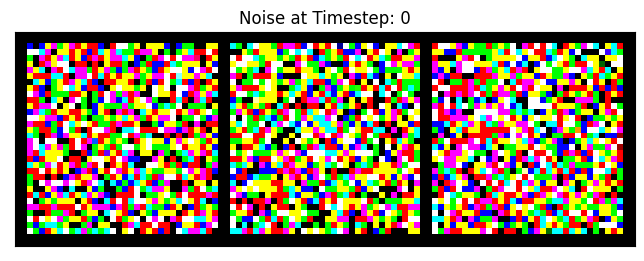

In [33]:
"""Generated Image before Training."""
show_and_save_images(generated_image, nmax = 64, t = 0, index = 0, save = True, show = True)

In [34]:
"""Train Function."""

def Train(model: nn.Module, noise_scheduler, optimizer, loss_criterion, n_timesteps: int, x: torch.Tensor, y: torch.Tensor):
    torch.cuda.empty_cache()
    t = torch.randint(0, n_timesteps, size = (x.size(0),), dtype = torch.long).to(x.device)
    
    # Diffusion process
    noise = torch.randn_like(x).to(x.device) # Epsilon
    noise_x = noise_scheduler.diffusion_process(x, t, noise)

    if np.random.random() < 0.2: # To uncondition the network based on the random probability
        y = None
        
    # Reverse process
    noise_pred = model(noise_x, y, t) # Epsilon_Theta

    loss = loss_criterion(noise_pred.reshape(-1, image_size[0]), noise.reshape(-1, image_size[0]))

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    return loss

In [35]:
"""Fit Function."""

def Fit(epochs: int, lr: float, n_timesteps: int, inference_steps: int):

    optimizer = torch.optim.Adam(unet.parameters(), lr = lr)
    loss_criterion = nn.MSELoss()
    Losses = []
    index = 0

    for epoch in range(epochs):
        unet.train()
        epoch_loss = []
        
        for x, y in tqdm(Train_Dl):
            loss = Train(unet, ddpm, optimizer, loss_criterion, n_timesteps, x, y)
            epoch_loss.append(loss)
        
        mean_loss = torch.stack(epoch_loss).mean().item()
        Losses.append(mean_loss)

        print("Epoch [{}], train_loss: {:.4f}".format(
               epoch + 1, mean_loss))
        
        #if epoch % 10 == 0:
        index += 1
        generated_images, time_step = sampler(unet, ddpm, xt, labels, cfg_scale = 7.2, num_inference_steps = inference_steps)
        show_and_save_images(generated_images, nmax = 64, t = time_step, index = index, save = True, show = False)
        print('Done Saving.....')
            
            
    return Losses

In [36]:
epochs = 200

In [37]:
"""Kick-start of Training."""
history = Fit(epochs, lr, num_training_steps, num_inference_steps)

  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [1], train_loss: 0.6025
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [2], train_loss: 0.1983
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [3], train_loss: 0.1215
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [4], train_loss: 0.0936
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [5], train_loss: 0.0784
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [6], train_loss: 0.0668
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [7], train_loss: 0.0570
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [8], train_loss: 0.0513
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [9], train_loss: 0.0527
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [10], train_loss: 0.0442
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [11], train_loss: 0.0441
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [12], train_loss: 0.0414
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [13], train_loss: 0.0391
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [14], train_loss: 0.0397
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [15], train_loss: 0.0362
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [16], train_loss: 0.0337
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [17], train_loss: 0.0356
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [18], train_loss: 0.0343
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [19], train_loss: 0.0352
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [20], train_loss: 0.0337
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [21], train_loss: 0.0354
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [22], train_loss: 0.0320
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [23], train_loss: 0.0308
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [24], train_loss: 0.0299
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [25], train_loss: 0.0318
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [26], train_loss: 0.0306
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [27], train_loss: 0.0291
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [28], train_loss: 0.0299
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [29], train_loss: 0.0301
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [30], train_loss: 0.0298
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [31], train_loss: 0.0284
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [32], train_loss: 0.0296
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [33], train_loss: 0.0305
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [34], train_loss: 0.0301
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [35], train_loss: 0.0287
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [36], train_loss: 0.0285
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [37], train_loss: 0.0269
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [38], train_loss: 0.0272
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [39], train_loss: 0.0265
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [40], train_loss: 0.0266
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [41], train_loss: 0.0251
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [42], train_loss: 0.0279
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [43], train_loss: 0.0272
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [44], train_loss: 0.0268
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [45], train_loss: 0.0235
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [46], train_loss: 0.0261
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [47], train_loss: 0.0252
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [48], train_loss: 0.0260
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [49], train_loss: 0.0268
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [50], train_loss: 0.0262
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [51], train_loss: 0.0237
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [52], train_loss: 0.0240
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [53], train_loss: 0.0242
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [54], train_loss: 0.0242
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [55], train_loss: 0.0255
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [56], train_loss: 0.0265
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [57], train_loss: 0.0242
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [58], train_loss: 0.0232
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [59], train_loss: 0.0250
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [60], train_loss: 0.0234
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [61], train_loss: 0.0235
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [62], train_loss: 0.0253
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [63], train_loss: 0.0230
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [64], train_loss: 0.0235
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [65], train_loss: 0.0236
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [66], train_loss: 0.0250
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [67], train_loss: 0.0229
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [68], train_loss: 0.0232
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [69], train_loss: 0.0242
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [70], train_loss: 0.0225
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [71], train_loss: 0.0240
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [72], train_loss: 0.0244
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [73], train_loss: 0.0227
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [74], train_loss: 0.0230
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [75], train_loss: 0.0230
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [76], train_loss: 0.0224
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [77], train_loss: 0.0218
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [78], train_loss: 0.0226
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [79], train_loss: 0.0237
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [80], train_loss: 0.0219
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [81], train_loss: 0.0231
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [82], train_loss: 0.0217
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [83], train_loss: 0.0228
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [84], train_loss: 0.0223
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [85], train_loss: 0.0204
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [86], train_loss: 0.0239
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [87], train_loss: 0.0227
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [88], train_loss: 0.0217
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [89], train_loss: 0.0218
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [90], train_loss: 0.0233
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [91], train_loss: 0.0237
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [92], train_loss: 0.0216
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [93], train_loss: 0.0194
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [94], train_loss: 0.0206
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [95], train_loss: 0.0230
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [96], train_loss: 0.0210
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [97], train_loss: 0.0211
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [98], train_loss: 0.0208
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [99], train_loss: 0.0223
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [100], train_loss: 0.0230
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [101], train_loss: 0.0210
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [102], train_loss: 0.0219
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [103], train_loss: 0.0201
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [104], train_loss: 0.0224
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [105], train_loss: 0.0216
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [106], train_loss: 0.0196
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [107], train_loss: 0.0217
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [108], train_loss: 0.0221
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [109], train_loss: 0.0208
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [110], train_loss: 0.0210
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [111], train_loss: 0.0207
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [112], train_loss: 0.0199
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [113], train_loss: 0.0192
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [114], train_loss: 0.0213
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [115], train_loss: 0.0209
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [116], train_loss: 0.0204
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [117], train_loss: 0.0208
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [118], train_loss: 0.0213
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [119], train_loss: 0.0203
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [120], train_loss: 0.0205
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [121], train_loss: 0.0197
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [122], train_loss: 0.0220
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [123], train_loss: 0.0219
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [124], train_loss: 0.0204
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [125], train_loss: 0.0187
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [126], train_loss: 0.0197
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [127], train_loss: 0.0201
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [128], train_loss: 0.0201
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [129], train_loss: 0.0211
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [130], train_loss: 0.0207
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [131], train_loss: 0.0202
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [132], train_loss: 0.0218
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [133], train_loss: 0.0205
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [134], train_loss: 0.0202
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [135], train_loss: 0.0196
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [136], train_loss: 0.0188
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [137], train_loss: 0.0179
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [138], train_loss: 0.0192
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [139], train_loss: 0.0199
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [140], train_loss: 0.0202
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [141], train_loss: 0.0209
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [142], train_loss: 0.0204
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [143], train_loss: 0.0198
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [144], train_loss: 0.0199
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [145], train_loss: 0.0198
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [146], train_loss: 0.0184
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [147], train_loss: 0.0192
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [148], train_loss: 0.0185
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [149], train_loss: 0.0195
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [150], train_loss: 0.0213
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [151], train_loss: 0.0204
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [152], train_loss: 0.0186
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [153], train_loss: 0.0196
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [154], train_loss: 0.0203
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [155], train_loss: 0.0190
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [156], train_loss: 0.0184
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [157], train_loss: 0.0192
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [158], train_loss: 0.0187
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [159], train_loss: 0.0192
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [160], train_loss: 0.0194
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [161], train_loss: 0.0196
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [162], train_loss: 0.0192
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [163], train_loss: 0.0174
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [164], train_loss: 0.0187
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [165], train_loss: 0.0191
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [166], train_loss: 0.0188
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [167], train_loss: 0.0183
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [168], train_loss: 0.0186
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [169], train_loss: 0.0182
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [170], train_loss: 0.0192
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [171], train_loss: 0.0187
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [172], train_loss: 0.0185
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [173], train_loss: 0.0179
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [174], train_loss: 0.0172
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [175], train_loss: 0.0177
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [176], train_loss: 0.0205
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [177], train_loss: 0.0182
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [178], train_loss: 0.0185
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [179], train_loss: 0.0180
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [180], train_loss: 0.0184
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [181], train_loss: 0.0181
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [182], train_loss: 0.0202
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [183], train_loss: 0.0185
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [184], train_loss: 0.0206
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [185], train_loss: 0.0176
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [186], train_loss: 0.0194
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [187], train_loss: 0.0177
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [188], train_loss: 0.0177
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [189], train_loss: 0.0181
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [190], train_loss: 0.0185
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [191], train_loss: 0.0189
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [192], train_loss: 0.0189
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [193], train_loss: 0.0183
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [194], train_loss: 0.0187
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [195], train_loss: 0.0185
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [196], train_loss: 0.0167
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [197], train_loss: 0.0187
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [198], train_loss: 0.0179
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [199], train_loss: 0.0183
Done Saving.....


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [200], train_loss: 0.0177
Done Saving.....


In [38]:
torch.save(unet.state_dict(), 'Diffusion.pth')

### 5. Visualization of Loss

In [39]:
loss = history

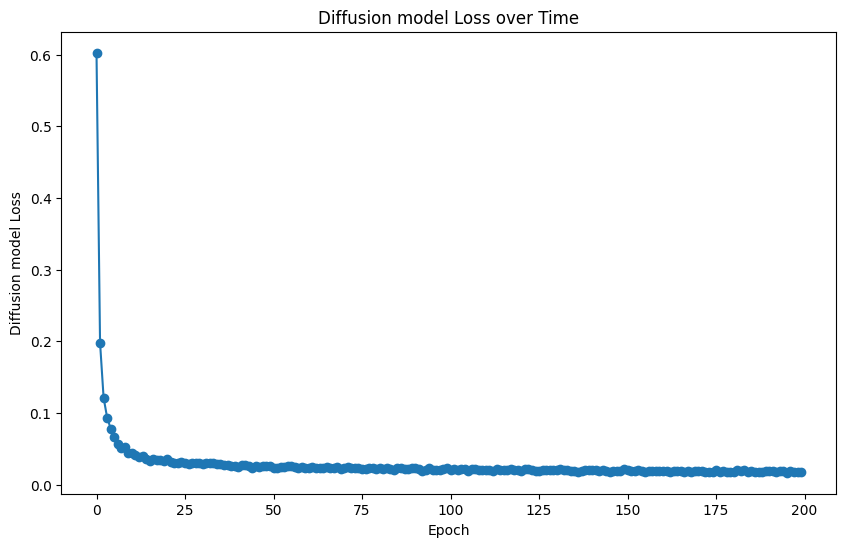

In [40]:
x = range(len(loss))

plt.figure(figsize=(10,6))
plt.plot(x, loss ,'-')
plt.scatter(x, loss)
plt.xlabel('Epoch')
plt.ylabel('Diffusion model Loss')
plt.title('Diffusion model Loss over Time')
plt.show()

### 6. Inference

In [12]:
unet.load_state_dict(torch.load('Diffusion.pth'))

<All keys matched successfully>

In [15]:
# Random Noise and Labels
xt = torch.randn((batch_size, image_size[0], image_size[1], image_size[2]), device = device)
labels = torch.randint(0, 2, size = (batch_size,), dtype = torch.long, device = device).flatten()
labels

tensor([1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1,
        1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
        1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')

In [18]:
generated_images, last_t = sampler(unet, ddpm, xt, labels, cfg_scale = 7.5, num_inference_steps = num_inference_steps, save = True)

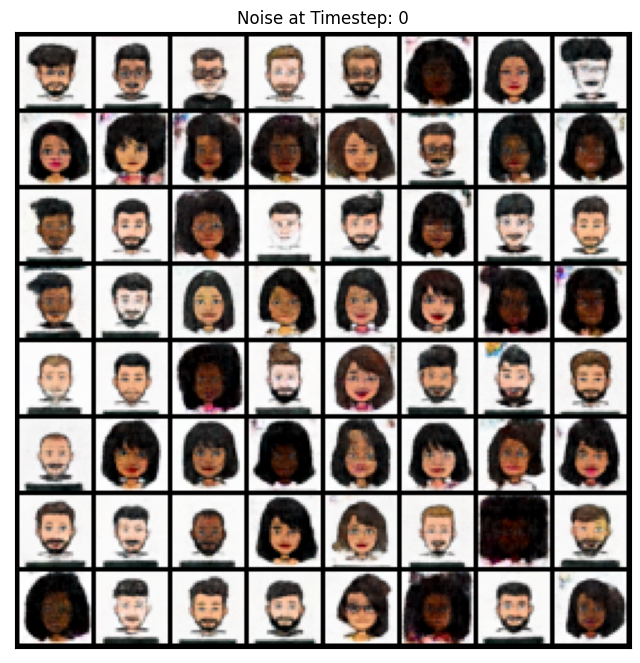

In [19]:
show_and_save_images(generated_images, nmax = 64, t = last_t, index = None, save = False, show = True)

In [49]:
# Random Noise and Female label
xt = torch.randn((batch_size, image_size[0], image_size[1], image_size[2]), generator = generator, device = device)
label = Label["female"]
labels = torch.ones(xt.size(0), dtype = torch.long, device = device).flatten() * label
labels

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')

In [50]:
generated_images, _ = sampler(unet, ddpm, xt, labels, cfg_scale = 7.5, num_inference_steps = num_inference_steps, save = False)

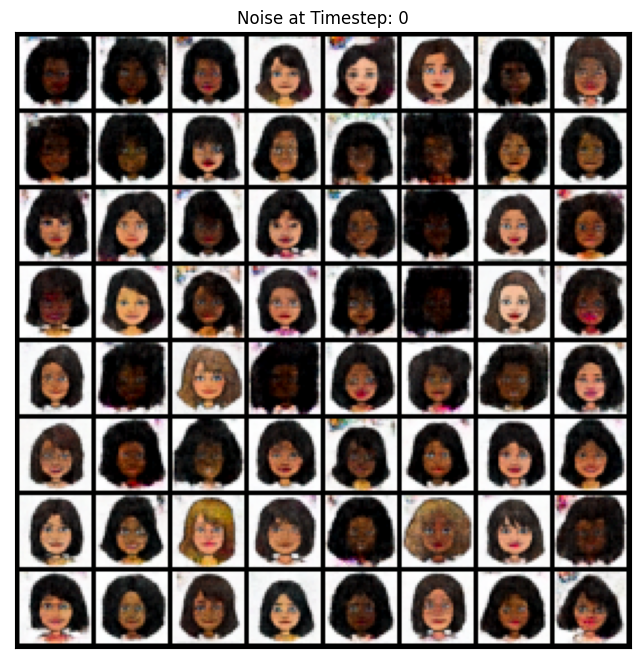

In [51]:
show_and_save_images(generated_images, nmax = 64, t = 0, index = None, save = False, show = True)

In [52]:
# Random Noise and Male label
xt = torch.randn((batch_size, image_size[0], image_size[1], image_size[2]), generator = generator, device = device)
label = Label["male"]
labels = torch.ones(xt.size(0), dtype = torch.long, device = device).flatten() * label
labels

tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')

In [53]:
generated_images, _ = sampler(unet, ddpm, xt, labels, cfg_scale = 7.5, num_inference_steps = num_inference_steps, save = False)

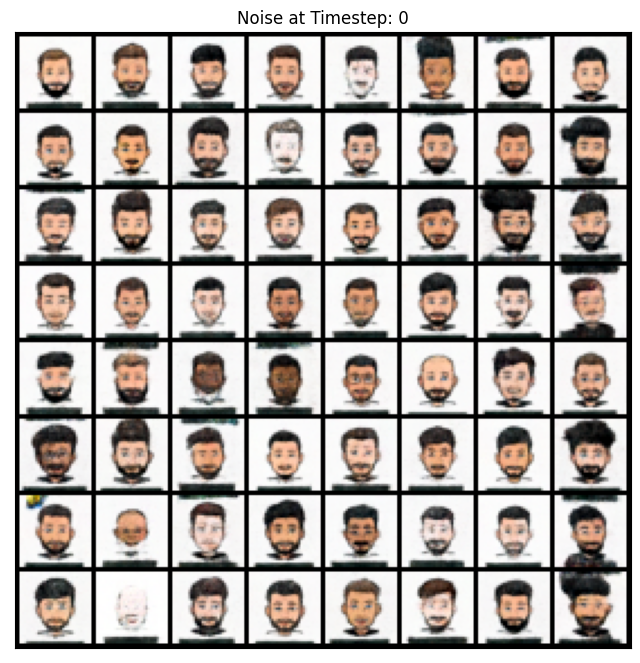

In [54]:
show_and_save_images(generated_images, nmax = 64, t = 0, index = None, save = False, show = True)

In [64]:
# Random Noise and no labels
xt = torch.randn((batch_size, image_size[0], image_size[1], image_size[2]), generator = generator, device = device)
label = None
labels = [label] * batch_size
labels

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [65]:
generated_images, _ = sampler(unet, ddpm, xt, labels, cfg_scale = 0, num_inference_steps = num_inference_steps, save = False)

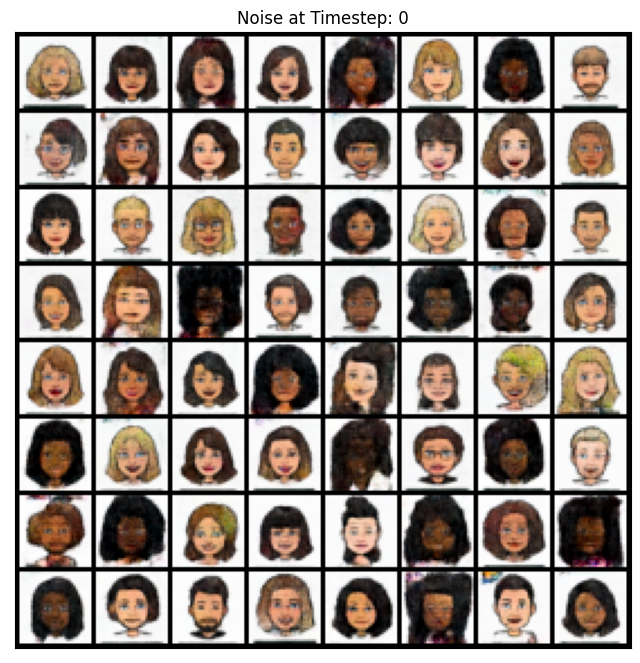

In [66]:
show_and_save_images(generated_images, nmax = 64, t = 0, index = None, save = False, show = True)

In [20]:
"""Create Video for Generated Images."""

vid_fname = 'ddpm_bitmoji_faces.mp4'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated-image' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 100, (640,663))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

1. It is seen that Female bitmoji faces are not as good as Male bitmoji Faces. Thus, more data is needs to be used train the model.
2. By making small tweak in model architecture, it is possible to create good quality images.


(process:28636): Pango-WARNING **: 16:17:42.979: couldn't load font "Linux libertine Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


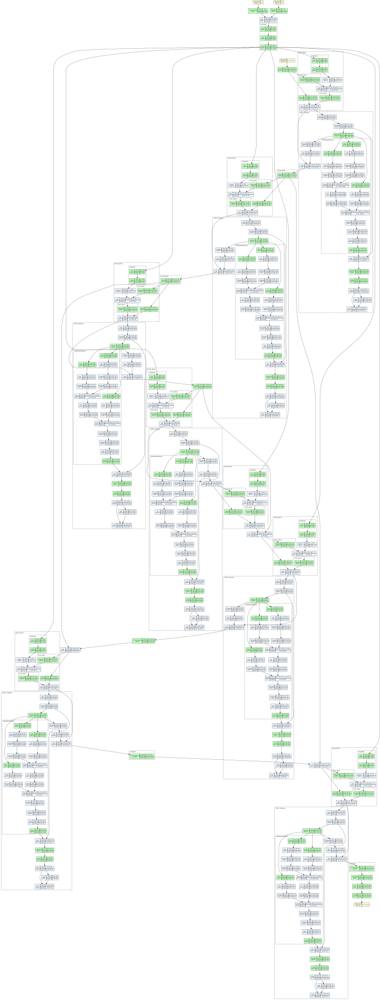

In [68]:
model_graph = draw_graph(unet, input_data = (img_dummy, labels_dummy, t), device = 'cpu', expand_nested = True)
model_graph.visual_graph

### 7. References
1. [DDPM Paper](https://arxiv.org/abs/2006.11239)
2. [YouTube](https://youtu.be/vu6eKteJWew?si=FnFf2A5AyYNtNiqF)
3. [YouTube](https://youtu.be/TBCRlnwJtZU?si=ydKy2uFuvEutYdXV)
4. [Github](https://github.com/hkproj/pytorch-ddpm)